In [164]:
#pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [170]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from plotnine import ggplot, aes, geom_count ,geom_violin ,geom_tile,scale_fill_gradient2

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
#import xgboost
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from datetime import datetime

# Import data

In [2]:
census_starter = pd.read_csv('census_starter.csv')
GoDaddy_train = pd.read_csv('train.csv')
GoDaddy_test = pd.read_csv('test.csv')

In [3]:
census_starter

,pct_bb_2017,pct_bb_2018,pct_bb_2019,pct_bb_2020,pct_bb_2021,cfips,pct_college_2017,pct_college_2018,pct_college_2019,pct_college_2020,...,pct_it_workers_2017,pct_it_workers_2018,pct_it_workers_2019,pct_it_workers_2020,pct_it_workers_2021,median_hh_inc_2017,median_hh_inc_2018,median_hh_inc_2019,median_hh_inc_2020,median_hh_inc_2021
0,76.6,78.9,80.6,82.7,85.5,1001,14.5,15.9,16.1,16.7,...,1.3,1.1,0.7,0.6,1.1,55317,58786.0,58731,57982.0,62660.0
1,74.5,78.1,81.8,85.1,87.9,1003,20.4,20.7,21.0,20.2,...,1.4,1.3,1.4,1.0,1.3,52562,55962.0,58320,61756.0,64346.0
2,57.2,60.4,60.5,64.6,64.6,1005,7.6,7.8,7.6,7.3,...,0.5,0.3,0.8,1.1,0.8,33368,34186.0,32525,34990.0,36422.0
3,62.0,66.1,69.2,76.1,74.6,1007,8.1,7.6,6.5,7.4,...,1.2,1.4,1.6,1.7,2.1,43404,45340.0,47542,51721.0,54277.0
4,65.8,68.5,73.0,79.6,81.0,1009,8.7,8.1,8.6,8.9,...,1.3,1.4,0.9,1.1,0.9,47412,48695.0,49358,48922.0,52830.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,82.2,82.4,84.0,86.7,88.4,56037,15.3,15.2,14.8,13.7,...,0.6,0.6,1.0,0.9,1.0,71083,73008.0,74843,73384.0,76668.0
3138,83.5,85.9,87.1,89.1,90.5,56039,37.7,37.8,38.9,37.2,...,0.7,1.2,1.4,1.5,2.0,80049,83831.0,84678,87053.0,94498.0
3139,83.8,88.2,89.5,91.4,90.6,56041,11.9,10.5,11.1,12.6,...,1.2,1.2,1.4,1.7,0.9,54672,58235.0,63403,72458.0,75106.0
3140,76.4,78.3,78.2,82.8,85.4,56043,15.4,15.0,15.4,15.0,...,1.3,1.0,0.9,0.9,1.1,51362,53426.0,54158,57306.0,62271.0


In [4]:
GoDaddy_train.head()

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243


# Explored data 

In [5]:
len(set(GoDaddy_train['cfips']))

# there are 3135 states

3135

In [6]:
set(GoDaddy_train['cfips'])

{41001,
 41003,
 41005,
 41007,
 41009,
 41011,
 41013,
 41015,
 41017,
 41019,
 41021,
 41023,
 41025,
 41027,
 41029,
 41031,
 41033,
 41035,
 41037,
 41039,
 41041,
 41043,
 41045,
 41047,
 41049,
 41051,
 41053,
 41055,
 41057,
 41059,
 41061,
 41063,
 41065,
 41067,
 41069,
 41071,
 33001,
 33003,
 33005,
 33007,
 33009,
 33011,
 33013,
 33015,
 33017,
 33019,
 25001,
 25003,
 25005,
 25007,
 25009,
 25011,
 25013,
 25015,
 25017,
 25019,
 25021,
 25023,
 25025,
 25027,
 17001,
 17003,
 17005,
 17007,
 17009,
 17011,
 17013,
 17015,
 17017,
 17019,
 17021,
 17023,
 17025,
 17027,
 17029,
 17031,
 17033,
 17035,
 17037,
 17039,
 17041,
 17043,
 17045,
 17047,
 17049,
 17051,
 17053,
 17055,
 17057,
 17059,
 17061,
 17063,
 17065,
 17067,
 17069,
 17071,
 17073,
 17075,
 17077,
 17079,
 17081,
 17083,
 17085,
 17087,
 17089,
 17091,
 17093,
 17095,
 17097,
 17099,
 17101,
 17103,
 17105,
 17107,
 17109,
 17111,
 17113,
 17115,
 17117,
 17119,
 17121,
 17123,
 17125,
 17127,
 17129,


In [7]:
len(set(GoDaddy_train['first_day_of_month']))

# for every country and state have 39 days

39

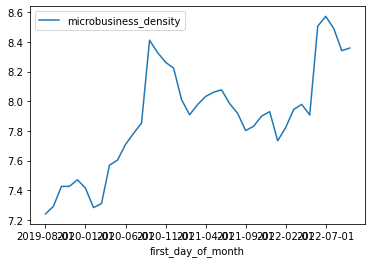

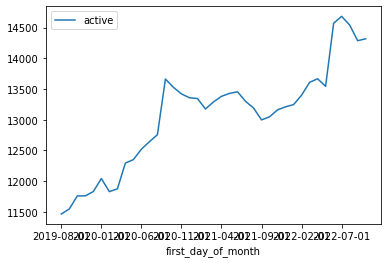

In [8]:
GoDaddy_train[GoDaddy_train['cfips']==1003].plot('first_day_of_month','microbusiness_density')
GoDaddy_train[GoDaddy_train['cfips']==1003].plot('first_day_of_month','active')

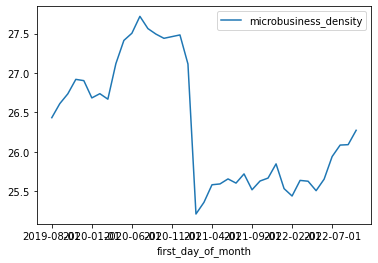

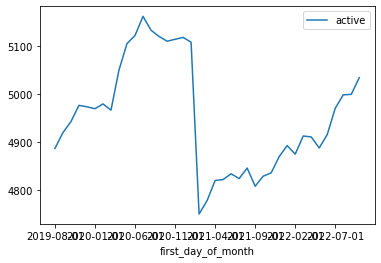

In [469]:
GoDaddy_train[GoDaddy_train['cfips']==56039].plot('first_day_of_month','microbusiness_density')
GoDaddy_train[GoDaddy_train['cfips']==56039].plot('first_day_of_month','active')

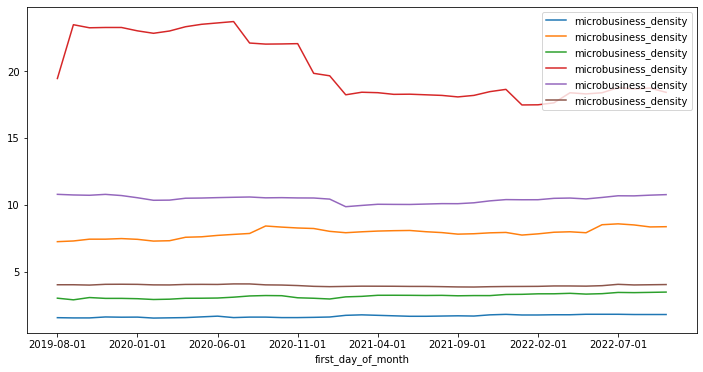

In [10]:
fig, ax = plt.subplots(figsize=(12, 6))
GoDaddy_train[GoDaddy_train['cfips']==56045].plot('first_day_of_month', 'microbusiness_density', ax=ax)
GoDaddy_train[GoDaddy_train['cfips']==1003].plot('first_day_of_month', 'microbusiness_density', ax=ax)
GoDaddy_train[GoDaddy_train['cfips']==1001].plot('first_day_of_month', 'microbusiness_density', ax=ax)
GoDaddy_train[GoDaddy_train['cfips']==25019].plot('first_day_of_month', 'microbusiness_density', ax=ax)
GoDaddy_train[GoDaddy_train['cfips']==25017].plot('first_day_of_month', 'microbusiness_density', ax=ax)
GoDaddy_train[GoDaddy_train['cfips']==25013].plot('first_day_of_month', 'microbusiness_density', ax=ax)

In [11]:
GoDaddy_train.describe().T

,count,mean,std,min,25%,50%,75%,max
cfips,122265.0,30376.037640,15143.508721,1001.0,18177.000000,29173.000000,45077.000000,5.604500e+04
microbusiness_density,122265.0,3.817671,4.991087,0.0,1.639344,2.586543,4.519231,2.843400e+02
active,122265.0,6442.858218,33040.012493,0.0,145.000000,488.000000,2124.000000,1.167744e+06


In [12]:
GoDaddy_train.groupby(['county','state'],as_index=False)['microbusiness_density'].max()

,county,state,microbusiness_density
0,Abbeville County,South Carolina,1.631714
1,Acadia Parish,Louisiana,1.721696
2,Accomack County,Virginia,2.968696
3,Ada County,Idaho,12.190519
4,Adair County,Iowa,3.099803
...,...,...,...
3130,Yuma County,Arizona,2.242331
3131,Yuma County,Colorado,3.678067
3132,Zapata County,Texas,0.674607
3133,Zavala County,Texas,0.690220


In [13]:
GoDaddy_train.groupby(['county','state'],as_index=False)['microbusiness_density'].min()

,county,state,microbusiness_density
0,Abbeville County,South Carolina,1.149131
1,Acadia Parish,Louisiana,1.509598
2,Accomack County,Virginia,2.286579
3,Ada County,Idaho,11.528472
4,Adair County,Iowa,2.039343
...,...,...,...
3130,Yuma County,Arizona,2.068479
3131,Yuma County,Colorado,3.018765
3132,Zapata County,Texas,0.367184
3133,Zavala County,Texas,0.341860


In [14]:
GoDaddy_train.groupby(['county','state'],as_index=False)['microbusiness_density'].mean()

,county,state,microbusiness_density
0,Abbeville County,South Carolina,1.348683
1,Acadia Parish,Louisiana,1.617206
2,Accomack County,Virginia,2.565237
3,Ada County,Idaho,11.803243
4,Adair County,Iowa,2.468495
...,...,...,...
3130,Yuma County,Arizona,2.169735
3131,Yuma County,Colorado,3.313447
3132,Zapata County,Texas,0.528720
3133,Zavala County,Texas,0.490025


In [24]:
#GoDaddy_train.groupby(['county','state'],as_index=False).describe().T

In [15]:
sum_md = GoDaddy_train.groupby(['county','state'],as_index=False)['active'].sum().nlargest(20, 'active')


In [16]:
sum_md['country_state'] = sum_md['county'] + '-' + sum_md['state']

In [17]:
sum_md

,county,state,active,country_state
1710,Los Angeles County,California,43842767,Los Angeles County-California
1781,Maricopa County,Arizona,18238217,Maricopa County-Arizona
2058,New York County,New York,17943980,New York County-New York
2133,Orange County,California,16365539,Orange County-California
527,Clark County,Nevada,14242264,Clark County-Nevada
2495,San Diego County,California,14132392,San Diego County-California
628,Cook County,Illinois,13946867,Cook County-Illinois
1905,Miami-Dade County,Florida,13859930,Miami-Dade County-Florida
1207,Harris County,Texas,11600516,Harris County-Texas
283,Broward County,Florida,10832374,Broward County-Florida


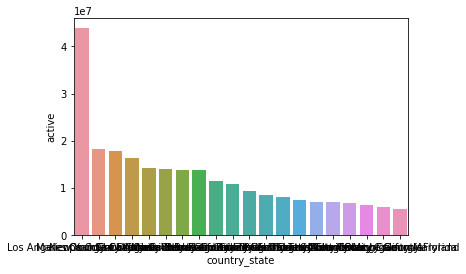

In [18]:
sns.barplot(x='country_state',
            y="active", data=sum_md,
            order=sum_md.sort_values('active',ascending = False).country_state)

In [19]:
sum_md2 = GoDaddy_train.groupby(['county'],as_index=False)['active'].sum().nlargest(20, 'active')

In [20]:
sum_md2

,county,active
999,Los Angeles County,43842767
1242,Orange County,23266851
1039,Maricopa County,18238217
1184,New York County,17943980
347,Clark County,15827161
1470,San Diego County,14132392
397,Cook County,13971074
1102,Miami-Dade County,13859930
1135,Montgomery County,12313737
734,Harris County,11642363


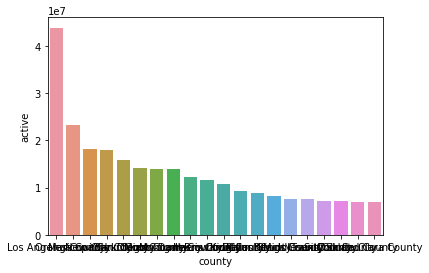

In [21]:
sns.barplot(x='county',
            y="active", data=sum_md2,
            order=sum_md2.sort_values('active',ascending = False).county)

In [24]:
GoDaddy_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243
...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100


# Sample Split -> Train dataset 2019-2021 , Test dataset 2022

In [25]:
set(GoDaddy_train['first_day_of_month'])

{'2019-08-01',
 '2019-09-01',
 '2019-10-01',
 '2019-11-01',
 '2019-12-01',
 '2020-01-01',
 '2020-02-01',
 '2020-03-01',
 '2020-04-01',
 '2020-05-01',
 '2020-06-01',
 '2020-07-01',
 '2020-08-01',
 '2020-09-01',
 '2020-10-01',
 '2020-11-01',
 '2020-12-01',
 '2021-01-01',
 '2021-02-01',
 '2021-03-01',
 '2021-04-01',
 '2021-05-01',
 '2021-06-01',
 '2021-07-01',
 '2021-08-01',
 '2021-09-01',
 '2021-10-01',
 '2021-11-01',
 '2021-12-01',
 '2022-01-01',
 '2022-02-01',
 '2022-03-01',
 '2022-04-01',
 '2022-05-01',
 '2022-06-01',
 '2022-07-01',
 '2022-08-01',
 '2022-09-01',
 '2022-10-01'}

In [28]:
GoDaddy_train['first_day_of_month'].iloc[0].split('-')[0]

'2019'

In [55]:
GoDaddy_train['year'] = GoDaddy_train.apply(lambda x: int(x['first_day_of_month'].split('-')[0]),axis=1)
GoDaddy_train['month'] = GoDaddy_train.apply(lambda x: int(x['first_day_of_month'].split('-')[1]),axis=1)

In [56]:
GoDaddy_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12
...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9


In [57]:
GoDaddy_train_train = GoDaddy_train[GoDaddy_train['year']!=2022]
GoDaddy_train_test = GoDaddy_train[GoDaddy_train['year']==2022]

In [58]:
GoDaddy_train_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12
...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11


In [59]:
GoDaddy_train_test

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5
...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9


# Use only train dataset to train model (2019-2021)

In [60]:
GoDaddy_train_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12
...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11


# Train

In [61]:
GoDaddy_train_train.corr()

,cfips,microbusiness_density,active,year,month
cfips,1.000000e+00,-0.011529,-0.062728,-1.470678e-17,3.912897e-18
microbusiness_density,-1.152920e-02,1.000000,0.328053,1.029306e-02,6.097877e-03
active,-6.272777e-02,0.328053,1.000000,1.448390e-03,1.271239e-03
year,-1.470678e-17,0.010293,0.001448,1.000000e+00,-2.981808e-01
month,3.912897e-18,0.006098,0.001271,-2.981808e-01,1.000000e+00


<ipython-input-68-0f95c5115e52>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-68-0f95c5115e52>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-68-0f95c5115e52>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


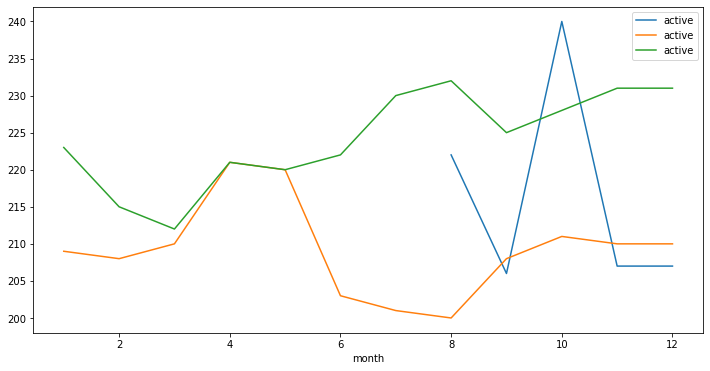

In [68]:
fig, ax = plt.subplots(figsize=(12, 6))
GoDaddy_train_train[GoDaddy_train_train['cfips']==1005][GoDaddy_train_train['year']==2019].plot('month', 'active', ax=ax)
GoDaddy_train_train[GoDaddy_train_train['cfips']==1005][GoDaddy_train_train['year']==2020].plot('month', 'active', ax=ax)
GoDaddy_train_train[GoDaddy_train_train['cfips']==1005][GoDaddy_train_train['year']==2021].plot('month', 'active', ax=ax)

In [69]:
GoDaddy_train_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12
...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11


### สร้าง dummy สำหรับ feature ที่เป็น category

In [72]:
county_dummy = pd.get_dummies(GoDaddy_train_train['county'],drop_first=True)
state_dummy = pd.get_dummies(GoDaddy_train_train['state'],drop_first=True)

In [74]:
county_dummy

,Acadia Parish,Accomack County,Ada County,Adair County,Adams County,Addison County,Aiken County,Aitkin County,Alachua County,Alamance County,...,Yoakum County,Yolo County,York County,Young County,Yuba County,Yukon-Koyukuk Census Area,Yuma County,Zapata County,Zavala County,Ziebach County
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
122251,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
122252,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
122253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [77]:
GoDaddy_train_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12
...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11


In [79]:
GoDaddy_train_train_all = pd.concat([GoDaddy_train_train,county_dummy, state_dummy], axis=1)

In [80]:
GoDaddy_train_train_all

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,Acadia Parish,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,0,...,0,0,0,0,0,0,0,0,0,0
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,0,...,0,0,0,0,0,0,0,0,0,0
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,0,...,0,0,0,0,0,0,0,0,0,0
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,0,...,0,0,0,0,0,0,0,0,0,0
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8,0,...,0,0,0,0,0,0,0,0,0,1
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9,0,...,0,0,0,0,0,0,0,0,0,1
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10,0,...,0,0,0,0,0,0,0,0,0,1
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11,0,...,0,0,0,0,0,0,0,0,0,1


In [81]:
GoDaddy_train_train_all.iloc[:,7:]

,year,month,Acadia Parish,Accomack County,Ada County,Adair County,Adams County,Addison County,Aiken County,Aitkin County,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,2019,8,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2019,9,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2019,10,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2019,11,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2019,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,2021,8,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
122251,2021,9,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
122252,2021,10,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
122253,2021,11,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [82]:
GoDaddy_train_train_all_X = GoDaddy_train_train_all.iloc[:,7:]

In [83]:

GoDaddy_train_train_all_Y_microbusiness_density = GoDaddy_train_train_all['microbusiness_density']
GoDaddy_train_train_all_Y_active = GoDaddy_train_train_all['active']

# Linear Regression

# Train by traget = microbusiness_density

In [86]:
reg = LinearRegression()
reg.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_microbusiness_density)

LinearRegression()

In [87]:
predictions = reg.predict(GoDaddy_train_train_all_X)

In [88]:
predictions

array([2.99649224, 3.01013655, 3.02378087, ..., 1.72791115, 1.74155547,
       1.75519978])

In [92]:
#R^2
reg.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_microbusiness_density)

0.541821245412405

In [91]:
#MSE
mean_squared_error(GoDaddy_train_train_all_Y_microbusiness_density, predictions, squared=False)

3.1736940219833802

# Train by traget = active

In [93]:
reg2 = LinearRegression()
reg2.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)
predictions2 = reg2.predict(GoDaddy_train_train_all_X)



In [94]:
reg2.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)

0.8250963515031645

In [95]:
mean_squared_error(GoDaddy_train_train_all_Y_active, predictions2, squared=False)

13695.174028697576

In [99]:
GoDaddy_train_train2 = GoDaddy_train_train

In [100]:
GoDaddy_train_train2['pred'] = predictions2

<ipython-input-100-336963b1f04c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [450]:
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1001]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,pred,dt_pred,rf_pred,rf2_pred,rf3_pred
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,1206.511939,6274.823604,1240.98,1238.8,1249.0
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,1224.213802,6274.823604,1220.66,1213.3,1208.2
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,1241.915666,6274.823604,1257.58,1245.1,1240.6
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,1259.617530,6274.823604,1250.31,1248.9,1258.6
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,1277.319393,6274.823604,1243.73,1243.7,1253.4
5,1001_2020-01-01,1001,Autauga County,Alabama,2020-01-01,2.969090,1242,2020,1,1172.997026,6243.297714,1236.23,1235.3,1239.0
6,1001_2020-02-01,1001,Autauga County,Alabama,2020-02-01,2.909326,1217,2020,2,1190.698890,6243.297714,1224.15,1222.8,1219.0
7,1001_2020-03-01,1001,Autauga County,Alabama,2020-03-01,2.933231,1227,2020,3,1208.400754,6243.297714,1227.96,1227.8,1227.0
8,1001_2020-04-01,1001,Autauga County,Alabama,2020-04-01,3.000167,1255,2020,4,1226.102618,6340.294657,1249.07,1245.6,1249.4
9,1001_2020-05-01,1001,Autauga County,Alabama,2020-05-01,3.004948,1257,2020,5,1243.804481,6340.294657,1257.91,1259.9,1256.2


In [111]:
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1009]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,pred
156,1009_2019-08-01,1009,Blount County,Alabama,2019-08-01,1.544148,681,2019,8,2131.836157
157,1009_2019-09-01,1009,Blount County,Alabama,2019-09-01,1.575892,695,2019,9,2149.538021
158,1009_2019-10-01,1009,Blount County,Alabama,2019-10-01,1.546415,682,2019,10,2167.239885
159,1009_2019-11-01,1009,Blount County,Alabama,2019-11-01,1.573625,694,2019,11,2184.941748
160,1009_2019-12-01,1009,Blount County,Alabama,2019-12-01,1.555485,686,2019,12,2202.643612
161,1009_2020-01-01,1009,Blount County,Alabama,2020-01-01,1.573217,695,2020,1,2098.321245
162,1009_2020-02-01,1009,Blount County,Alabama,2020-02-01,1.536999,679,2020,2,2116.023109
163,1009_2020-03-01,1009,Blount County,Alabama,2020-03-01,1.541526,681,2020,3,2133.724973
164,1009_2020-04-01,1009,Blount County,Alabama,2020-04-01,1.577744,697,2020,4,2151.426836
165,1009_2020-05-01,1009,Blount County,Alabama,2020-05-01,1.575481,696,2020,5,2169.128700


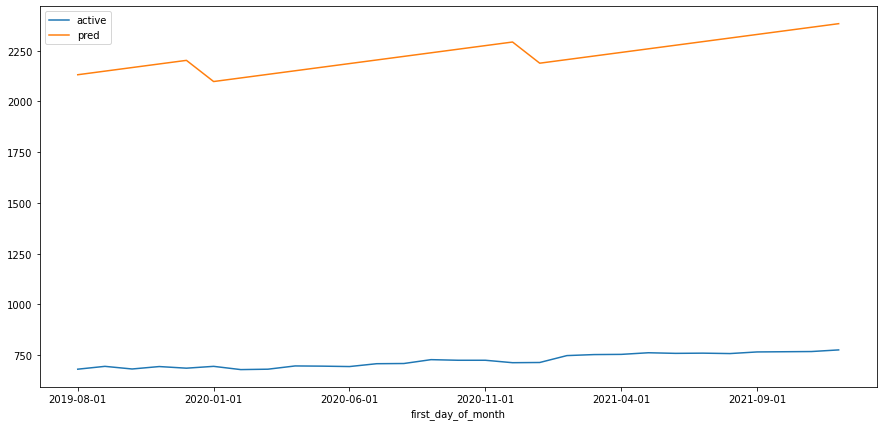

In [116]:
fig, ax = plt.subplots(figsize=(15, 7))
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1009].plot('first_day_of_month', 'active',ax=ax)
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1009].plot('first_day_of_month', 'pred',ax=ax)

# DecisionTree

In [153]:
dt = DecisionTreeRegressor(max_depth=1000,
                           min_samples_leaf=0.1,
                           random_state=2)

In [154]:
dt.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)

DecisionTreeRegressor(max_depth=1000, min_samples_leaf=0.1, random_state=2)

In [155]:
dt_pred = dt.predict(GoDaddy_train_train_all_X)

In [156]:
dt_pred

array([6274.82360447, 6274.82360447, 6274.82360447, ..., 6514.35704413,
       6514.35704413, 6514.35704413])

In [157]:
print( 'R2 = ' + str(dt.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_train_all_Y_active, dt_pred, squared=False)))

R2 = 5.806186394341495e-06
MSE = 32746.64864340161


In [158]:
GoDaddy_train_train2['dt_pred'] = dt_pred

<ipython-input-158-248378224616>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [159]:
GoDaddy_train_train2

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,pred,dt_pred
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,1206.511939,6274.823604
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,1224.213802,6274.823604
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,1241.915666,6274.823604
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,1259.617530,6274.823604
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,1277.319393,6274.823604
...,...,...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8,173.671487,6402.165614
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9,191.373351,6402.165614
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10,209.075215,6514.357044
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11,226.777078,6514.357044


# Random forest

In [171]:
rf = RandomForestRegressor(n_estimators = 100, random_state = 0)

In [172]:
rf.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)

RandomForestRegressor(random_state=0)

In [173]:
rf_pred = rf.predict(GoDaddy_train_train_all_X)

In [174]:
rf_pred

array([1240.98, 1220.66, 1257.58, ...,   93.84,   96.61,   98.35])

In [175]:
print( 'R2 = ' + str(rf.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_train_all_Y_active, rf_pred, squared=False)))

R2 = 0.9999381127803756
MSE = 257.61349327454235


In [176]:
GoDaddy_train_train2['rf_pred'] = rf_pred

<ipython-input-176-2512b2df7f91>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [177]:
GoDaddy_train_train2

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,pred,dt_pred,rf_pred
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,1206.511939,6274.823604,1240.98
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,1224.213802,6274.823604,1220.66
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,1241.915666,6274.823604,1257.58
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,1259.617530,6274.823604,1250.31
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,1277.319393,6274.823604,1243.73
...,...,...,...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8,173.671487,6402.165614,92.81
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9,191.373351,6402.165614,93.62
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10,209.075215,6514.357044,93.84
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11,226.777078,6514.357044,96.61


# -------------------------------------------------------------------------------------------

In [178]:
rf2 = RandomForestRegressor(n_estimators = 10, random_state = 0)
rf2.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)
rf2_pred = rf2.predict(GoDaddy_train_train_all_X)

In [179]:
print( 'R2 = ' + str(rf2.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_train_all_Y_active, rf2_pred, squared=False)))

R2 = 0.999916726129344
MSE = 298.8288315187886


In [180]:
GoDaddy_train_train2['rf2_pred'] = rf2_pred

<ipython-input-180-75067ab9be36>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [181]:
GoDaddy_train_train2

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,pred,dt_pred,rf_pred,rf2_pred
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,1206.511939,6274.823604,1240.98,1238.8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,1224.213802,6274.823604,1220.66,1213.3
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,1241.915666,6274.823604,1257.58,1245.1
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,1259.617530,6274.823604,1250.31,1248.9
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,1277.319393,6274.823604,1243.73,1243.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,Weston County,Wyoming,2021-08-01,1.670559,93,2021,8,173.671487,6402.165614,92.81,93.0
122251,56045_2021-09-01,56045,Weston County,Wyoming,2021-09-01,1.688522,94,2021,9,191.373351,6402.165614,93.62,93.7
122252,56045_2021-10-01,56045,Weston County,Wyoming,2021-10-01,1.670559,93,2021,10,209.075215,6514.357044,93.84,93.9
122253,56045_2021-11-01,56045,Weston County,Wyoming,2021-11-01,1.760374,98,2021,11,226.777078,6514.357044,96.61,98.0


# -------------------------------------------------------------------------------------------


In [210]:
rf3 = RandomForestRegressor(n_estimators = 5, random_state = 0)
rf3.fit(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)
rf3_pred = rf3.predict(GoDaddy_train_train_all_X)

In [211]:
print( 'R2 = ' + str(rf3.score(GoDaddy_train_train_all_X, GoDaddy_train_train_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_train_all_Y_active, rf3_pred, squared=False)))

R2 = 0.9998927398726177
MSE = 339.14644967218635


In [212]:
GoDaddy_train_train2['rf3_pred'] = rf3_pred

<ipython-input-212-44c4147db331>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


# -------------------------------------------------------------------------------------------


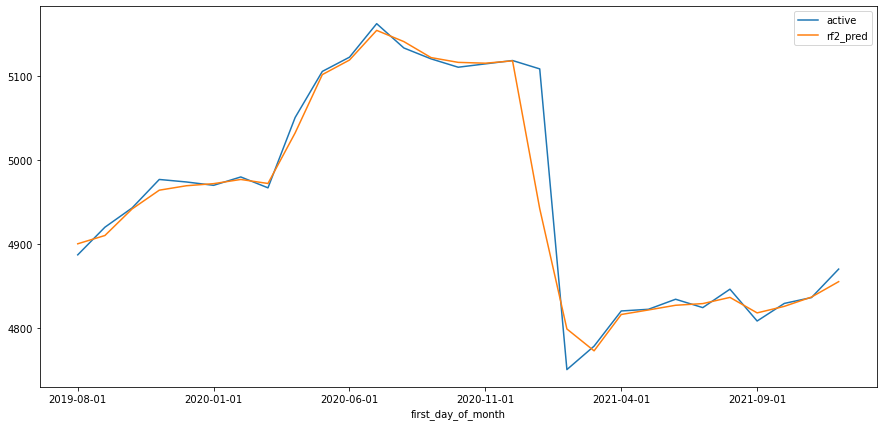

In [468]:
fig, ax = plt.subplots(figsize=(15, 7))
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==56039].plot('first_day_of_month', 'active',ax=ax)
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==56039].plot('first_day_of_month', 'rf2_pred',ax=ax)

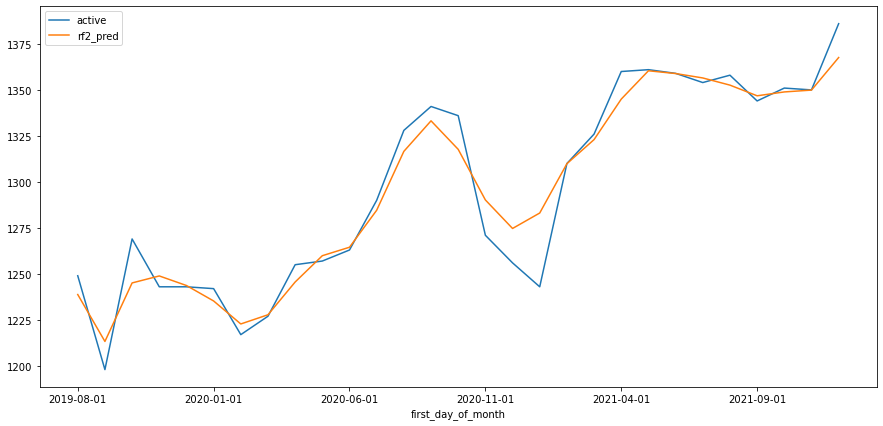

In [186]:
fig, ax = plt.subplots(figsize=(15, 7))
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1001].plot('first_day_of_month', 'active',ax=ax)
GoDaddy_train_train2[GoDaddy_train_train2['cfips']==1001].plot('first_day_of_month', 'rf2_pred',ax=ax)

In [187]:
GoDaddy_train_test

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5
...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9


In [188]:
county_dummy = pd.get_dummies(GoDaddy_train_test['county'],drop_first=True)
state_dummy = pd.get_dummies(GoDaddy_train_test['state'],drop_first=True)

In [189]:
GoDaddy_train_test_all = pd.concat([GoDaddy_train_test,county_dummy, state_dummy], axis=1)

In [190]:
GoDaddy_train_test_all

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,Acadia Parish,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,0,...,0,0,0,0,0,0,0,0,0,0
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,0,...,0,0,0,0,0,0,0,0,0,0
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,0,...,0,0,0,0,0,0,0,0,0,0
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,0,...,0,0,0,0,0,0,0,0,0,0
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,0,...,0,0,0,0,0,0,0,0,0,1
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,0,...,0,0,0,0,0,0,0,0,0,1
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,0,...,0,0,0,0,0,0,0,0,0,1
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,0,...,0,0,0,0,0,0,0,0,0,1


In [192]:
GoDaddy_train_test_all_X = GoDaddy_train_test_all.iloc[:,7:]
GoDaddy_train_test_all_Y_microbusiness_density = GoDaddy_train_test_all['microbusiness_density']
GoDaddy_train_test_all_Y_active = GoDaddy_train_test_all['active']

# Predict with test set and evaluation : Selected model is RandomForest

In [193]:
reg_test_pred = reg2.predict(GoDaddy_train_test_all_X)

In [194]:
print( 'R2 = ' + str(reg2.score(GoDaddy_train_test_all_X, GoDaddy_train_test_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_test_all_Y_active, reg_test_pred, squared=False)))

R2 = 0.8252638382804172
MSE = 14160.040690955657


In [196]:
GoDaddy_train_test2 = GoDaddy_train_test

In [197]:
GoDaddy_train_test2['reg_pred'] = reg_test_pred

<ipython-input-197-8469604690c4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [198]:
GoDaddy_train_test2

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,reg_pred
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,1353.793294
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,1371.495158
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,1389.197021
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,1406.898885
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,1424.600749
...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,228.665894
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,246.367757
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,264.069621
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,281.771485


In [199]:
dt_test_pred = dt.predict(GoDaddy_train_test_all_X)
print( 'R2 = ' + str(dt.score(GoDaddy_train_test_all_X, GoDaddy_train_test_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_test_all_Y_active, dt_test_pred, squared=False)))

R2 = -7.184065059018252e-05
MSE = 33875.733291974866


In [200]:
GoDaddy_train_test2['dt_pred'] = dt_test_pred
GoDaddy_train_test2

<ipython-input-200-6ed32d57bb7c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,reg_pred,dt_pred
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,1353.793294,6337.383732
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,1371.495158,6337.383732
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,1389.197021,6337.383732
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,1406.898885,6337.383732
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,1424.600749,6402.165614
...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,228.665894,6402.165614
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,246.367757,6402.165614
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,264.069621,6402.165614
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,281.771485,6402.165614


In [201]:
rf_test_pred = rf.predict(GoDaddy_train_test_all_X)
print( 'R2 = ' + str(rf.score(GoDaddy_train_test_all_X, GoDaddy_train_test_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_test_all_Y_active, rf_test_pred, squared=False)))

R2 = 0.9943560780362302
MSE = 2544.8583013414877


In [202]:
GoDaddy_train_test2['rf_pred'] = rf_test_pred
GoDaddy_train_test2

<ipython-input-202-dfa4f45cf282>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,reg_pred,dt_pred,rf_pred
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,1353.793294,6337.383732,1266.90
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,1371.495158,6337.383732,1293.07
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,1389.197021,6337.383732,1321.11
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,1406.898885,6337.383732,1349.25
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,1424.600749,6402.165614,1358.24
...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,228.665894,6402.165614,92.52
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,246.367757,6402.165614,92.16
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,264.069621,6402.165614,92.81
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,281.771485,6402.165614,93.62


In [203]:
rf2_test_pred = rf2.predict(GoDaddy_train_test_all_X)
print( 'R2 = ' + str(rf2.score(GoDaddy_train_test_all_X, GoDaddy_train_test_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_test_all_Y_active, rf2_test_pred, squared=False)))

R2 = 0.9943702549921164
MSE = 2541.6600795299587


In [204]:
GoDaddy_train_test2['rf2_pred'] = rf2_test_pred
GoDaddy_train_test2

<ipython-input-204-34c679b52f53>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,reg_pred,dt_pred,rf_pred,rf2_pred
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,1353.793294,6337.383732,1266.90,1283.1
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,1371.495158,6337.383732,1293.07,1309.9
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,1389.197021,6337.383732,1321.11,1323.0
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,1406.898885,6337.383732,1349.25,1345.0
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,1424.600749,6402.165614,1358.24,1360.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,228.665894,6402.165614,92.52,92.4
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,246.367757,6402.165614,92.16,92.1
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,264.069621,6402.165614,92.81,93.0
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,281.771485,6402.165614,93.62,93.7


In [205]:
rf3_test_pred = rf3.predict(GoDaddy_train_test_all_X)
print( 'R2 = ' + str(rf3.score(GoDaddy_train_test_all_X, GoDaddy_train_test_all_Y_active)) )
print( 'MSE = ' + str(mean_squared_error(GoDaddy_train_test_all_Y_active, rf3_test_pred, squared=False)))

R2 = 0.9944041943661345
MSE = 2533.987196014776


In [206]:
GoDaddy_train_test2['rf3_pred'] = rf3_test_pred
GoDaddy_train_test2

<ipython-input-206-20e3db3d6458>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,reg_pred,dt_pred,rf_pred,rf2_pred,rf3_pred
29,1001_2022-01-01,1001,Autauga County,Alabama,2022-01-01,3.296781,1401,2022,1,1353.793294,6337.383732,1266.90,1283.1,1269.8
30,1001_2022-02-01,1001,Autauga County,Alabama,2022-02-01,3.334431,1417,2022,2,1371.495158,6337.383732,1293.07,1309.9,1296.6
31,1001_2022-03-01,1001,Autauga County,Alabama,2022-03-01,3.336785,1418,2022,3,1389.197021,6337.383732,1321.11,1323.0,1319.6
32,1001_2022-04-01,1001,Autauga County,Alabama,2022-04-01,3.372082,1433,2022,4,1406.898885,6337.383732,1349.25,1345.0,1336.4
33,1001_2022-05-01,1001,Autauga County,Alabama,2022-05-01,3.313253,1408,2022,5,1424.600749,6402.165614,1358.24,1360.4,1360.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,228.665894,6402.165614,92.52,92.4,92.4
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,246.367757,6402.165614,92.16,92.1,92.0
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,264.069621,6402.165614,92.81,93.0,92.8
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,281.771485,6402.165614,93.62,93.7,93.8


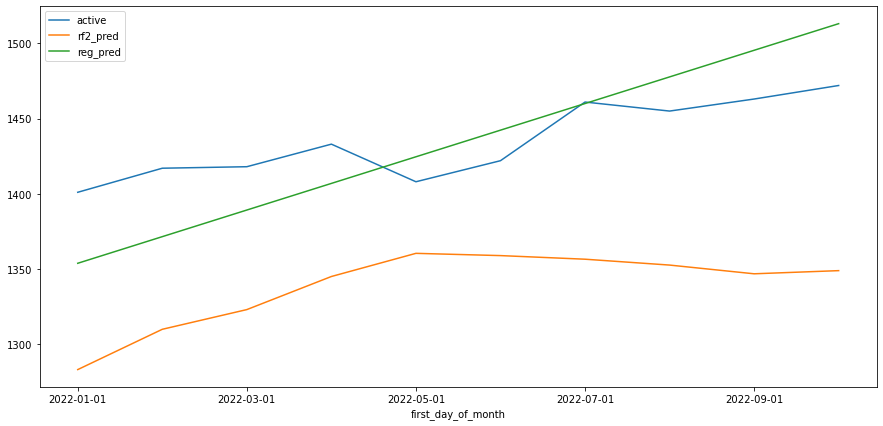

In [221]:
fig, ax = plt.subplots(figsize=(15, 7))
GoDaddy_train_test2[GoDaddy_train_test2['cfips']==1001].plot('first_day_of_month', 'active',ax=ax)
GoDaddy_train_test2[GoDaddy_train_test2['cfips']==1001].plot('first_day_of_month', 'rf2_pred',ax=ax)
GoDaddy_train_test2[GoDaddy_train_test2['cfips']==1001].plot('first_day_of_month', 'reg_pred',ax=ax)


In [223]:
census_starter.columns

Index(['pct_bb_2017', 'pct_bb_2018', 'pct_bb_2019', 'pct_bb_2020',
       'pct_bb_2021', 'cfips', 'pct_college_2017', 'pct_college_2018',
       'pct_college_2019', 'pct_college_2020', 'pct_college_2021',
       'pct_foreign_born_2017', 'pct_foreign_born_2018',
       'pct_foreign_born_2019', 'pct_foreign_born_2020',
       'pct_foreign_born_2021', 'pct_it_workers_2017', 'pct_it_workers_2018',
       'pct_it_workers_2019', 'pct_it_workers_2020', 'pct_it_workers_2021',
       'median_hh_inc_2017', 'median_hh_inc_2018', 'median_hh_inc_2019',
       'median_hh_inc_2020', 'median_hh_inc_2021'],
      dtype='object')

In [224]:
census_starter

,pct_bb_2017,pct_bb_2018,pct_bb_2019,pct_bb_2020,pct_bb_2021,cfips,pct_college_2017,pct_college_2018,pct_college_2019,pct_college_2020,...,pct_it_workers_2017,pct_it_workers_2018,pct_it_workers_2019,pct_it_workers_2020,pct_it_workers_2021,median_hh_inc_2017,median_hh_inc_2018,median_hh_inc_2019,median_hh_inc_2020,median_hh_inc_2021
0,76.6,78.9,80.6,82.7,85.5,1001,14.5,15.9,16.1,16.7,...,1.3,1.1,0.7,0.6,1.1,55317,58786.0,58731,57982.0,62660.0
1,74.5,78.1,81.8,85.1,87.9,1003,20.4,20.7,21.0,20.2,...,1.4,1.3,1.4,1.0,1.3,52562,55962.0,58320,61756.0,64346.0
2,57.2,60.4,60.5,64.6,64.6,1005,7.6,7.8,7.6,7.3,...,0.5,0.3,0.8,1.1,0.8,33368,34186.0,32525,34990.0,36422.0
3,62.0,66.1,69.2,76.1,74.6,1007,8.1,7.6,6.5,7.4,...,1.2,1.4,1.6,1.7,2.1,43404,45340.0,47542,51721.0,54277.0
4,65.8,68.5,73.0,79.6,81.0,1009,8.7,8.1,8.6,8.9,...,1.3,1.4,0.9,1.1,0.9,47412,48695.0,49358,48922.0,52830.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,82.2,82.4,84.0,86.7,88.4,56037,15.3,15.2,14.8,13.7,...,0.6,0.6,1.0,0.9,1.0,71083,73008.0,74843,73384.0,76668.0
3138,83.5,85.9,87.1,89.1,90.5,56039,37.7,37.8,38.9,37.2,...,0.7,1.2,1.4,1.5,2.0,80049,83831.0,84678,87053.0,94498.0
3139,83.8,88.2,89.5,91.4,90.6,56041,11.9,10.5,11.1,12.6,...,1.2,1.2,1.4,1.7,0.9,54672,58235.0,63403,72458.0,75106.0
3140,76.4,78.3,78.2,82.8,85.4,56043,15.4,15.0,15.4,15.0,...,1.3,1.0,0.9,0.9,1.1,51362,53426.0,54158,57306.0,62271.0


In [225]:
GoDaddy_test

,row_id,cfips,first_day_of_month
0,1001_2022-11-01,1001,2022-11-01
1,1003_2022-11-01,1003,2022-11-01
2,1005_2022-11-01,1005,2022-11-01
3,1007_2022-11-01,1007,2022-11-01
4,1009_2022-11-01,1009,2022-11-01
...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01
25076,56039_2023-06-01,56039,2023-06-01
25077,56041_2023-06-01,56041,2023-06-01
25078,56043_2023-06-01,56043,2023-06-01


# How to calcurate microbusiness_density

In [231]:
pd.set_option('max_columns', None)

In [273]:
census_starter[census_starter['cfips']==1001].T

,0
pct_bb_2017,76.6
pct_bb_2018,78.9
pct_bb_2019,80.6
pct_bb_2020,82.7
pct_bb_2021,85.5
cfips,1001.0
pct_college_2017,14.5
pct_college_2018,15.9
pct_college_2019,16.1
pct_college_2020,16.7


In [277]:
#(pct_bb_2017-pct_it_workers_2017)*median_hh_inc_2017

((76.6-1.3)/100)*55317.0

41653.701

In [278]:
census_starter[census_starter['cfips']==56045].T

,3141
pct_bb_2017,71.1
pct_bb_2018,73.3
pct_bb_2019,76.8
pct_bb_2020,79.7
pct_bb_2021,81.3
cfips,56045.0
pct_college_2017,14.1
pct_college_2018,13.5
pct_college_2019,13.4
pct_college_2020,12.7


In [279]:
((71.1-0.6)/100)*59605.0

42021.524999999994

### From exploring found that in each place will have difference based in each year 

In [280]:
GoDaddy_train2[GoDaddy_train2['cfips']==56045]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
122226,56045_2019-08-01,56045,Weston County,Wyoming,2019-08-01,1.548594,87,2019,8,5617.999984
122227,56045_2019-09-01,56045,Weston County,Wyoming,2019-09-01,1.530794,86,2019,9,5617.999878
122228,56045_2019-10-01,56045,Weston County,Wyoming,2019-10-01,1.530794,86,2019,10,5617.999878
122229,56045_2019-11-01,56045,Weston County,Wyoming,2019-11-01,1.601994,90,2019,11,5617.999937
122230,56045_2019-12-01,56045,Weston County,Wyoming,2019-12-01,1.584194,89,2019,12,5617.999834
122231,56045_2020-01-01,56045,Weston County,Wyoming,2020-01-01,1.590706,89,2020,1,5594.999921
122232,56045_2020-02-01,56045,Weston County,Wyoming,2020-02-01,1.519214,85,2020,2,5594.999903
122233,56045_2020-03-01,56045,Weston County,Wyoming,2020-03-01,1.537087,86,2020,3,5594.999907
122234,56045_2020-04-01,56045,Weston County,Wyoming,2020-04-01,1.554960,87,2020,4,5594.999912
122235,56045_2020-05-01,56045,Weston County,Wyoming,2020-05-01,1.608579,90,2020,5,5595.000273


In [265]:
GoDaddy_train2 = GoDaddy_train

In [267]:
GoDaddy_train2['based'] = GoDaddy_train2.apply(lambda x: (x['active']*100)/(x['microbusiness_density']+0.00000001) , axis=1)

In [268]:
GoDaddy_train2

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,41526.999161
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,41526.999633
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,41527.001038
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,41527.001499
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,41527.001499
...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,5600.999720
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,5600.999720
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,5600.999859
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,5600.999859


In [269]:
GoDaddy_train2[GoDaddy_train2['cfips']==1001]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,41526.999161
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,41526.999633
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,41527.001038
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,41527.001499
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,41527.001499
5,1001_2020-01-01,1001,Autauga County,Alabama,2020-01-01,2.969090,1242,2020,1,41830.998583
6,1001_2020-02-01,1001,Autauga County,Alabama,2020-02-01,2.909326,1217,2020,2,41831.000140
7,1001_2020-03-01,1001,Autauga County,Alabama,2020-03-01,2.933231,1227,2020,3,41830.998939
8,1001_2020-04-01,1001,Autauga County,Alabama,2020-04-01,3.000167,1255,2020,4,41830.999024
9,1001_2020-05-01,1001,Autauga County,Alabama,2020-05-01,3.004948,1257,2020,5,41831.001019


In [270]:
GoDaddy_train2[GoDaddy_train2['cfips']==1005]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
78,1005_2019-08-01,1005,Barbour County,Alabama,2019-08-01,1.073138,222,2019,8,20686.998252
79,1005_2019-09-01,1005,Barbour County,Alabama,2019-09-01,0.995794,206,2019,9,20686.999383
80,1005_2019-10-01,1005,Barbour County,Alabama,2019-10-01,1.160149,240,2019,10,20686.999568
81,1005_2019-11-01,1005,Barbour County,Alabama,2019-11-01,1.000628,207,2019,11,20686.998015
82,1005_2019-12-01,1005,Barbour County,Alabama,2019-12-01,1.000628,207,2019,12,20686.998015
83,1005_2020-01-01,1005,Barbour County,Alabama,2020-01-01,1.027229,209,2020,1,20345.998601
84,1005_2020-02-01,1005,Barbour County,Alabama,2020-02-01,1.022314,208,2020,2,20345.999171
85,1005_2020-03-01,1005,Barbour County,Alabama,2020-03-01,1.032144,210,2020,3,20345.998036
86,1005_2020-04-01,1005,Barbour County,Alabama,2020-04-01,1.086209,221,2020,4,20345.999651
87,1005_2020-05-01,1005,Barbour County,Alabama,2020-05-01,1.081294,220,2020,5,20346.000195


In [510]:
GoDaddy_train2[GoDaddy_train2['cfips']==28055]

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
55614,28055_2019-08-01,28055,Issaquena County,Mississippi,2019-08-01,0.179372,2,2019,8,1114.999983
55615,28055_2019-09-01,28055,Issaquena County,Mississippi,2019-09-01,0.179372,2,2019,9,1114.999983
55616,28055_2019-10-01,28055,Issaquena County,Mississippi,2019-10-01,0.179372,2,2019,10,1114.999983
55617,28055_2019-11-01,28055,Issaquena County,Mississippi,2019-11-01,0.179372,2,2019,11,1114.999983
55618,28055_2019-12-01,28055,Issaquena County,Mississippi,2019-12-01,0.179372,2,2019,12,1114.999983
55619,28055_2020-01-01,28055,Issaquena County,Mississippi,2020-01-01,0.177305,2,2020,1,1127.999902
55620,28055_2020-02-01,28055,Issaquena County,Mississippi,2020-02-01,0.177305,2,2020,2,1127.999902
55621,28055_2020-03-01,28055,Issaquena County,Mississippi,2020-03-01,0.177305,2,2020,3,1127.999902
55622,28055_2020-04-01,28055,Issaquena County,Mississippi,2020-04-01,0.177305,2,2020,4,1127.999902
55623,28055_2020-05-01,28055,Issaquena County,Mississippi,2020-05-01,0.177305,2,2020,5,1127.999902


In [281]:
GoDaddy_train2.groupby(['cfips','year'],as_index=False)['based'].mean()

,cfips,year,based
0,1001,2019,41527.000566
1,1001,2020,41831.000120
2,1001,2021,42174.999207
3,1001,2022,42496.000055
4,1003,2019,158361.000239
...,...,...,...
12535,56043,2022,6044.999930
12536,56045,2019,5617.999902
12537,56045,2020,5594.999946
12538,56045,2021,5567.000026


In [339]:
based_df = GoDaddy_train2.groupby(['cfips','year'],as_index=False)['based'].mean()

In [340]:
based_df

,cfips,year,based
0,1001,2019,41527.000566
1,1001,2020,41831.000120
2,1001,2021,42174.999207
3,1001,2022,42496.000055
4,1003,2019,158361.000239
...,...,...,...
12535,56043,2022,6044.999930
12536,56045,2019,5617.999902
12537,56045,2020,5594.999946
12538,56045,2021,5567.000026


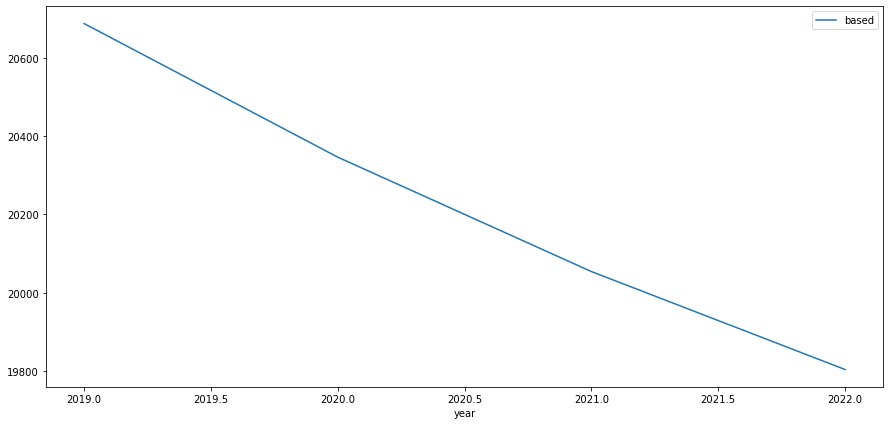

In [341]:
fig, ax = plt.subplots(figsize=(15, 7))
based_df[based_df['cfips']==1005].plot('year', 'based',ax=ax)

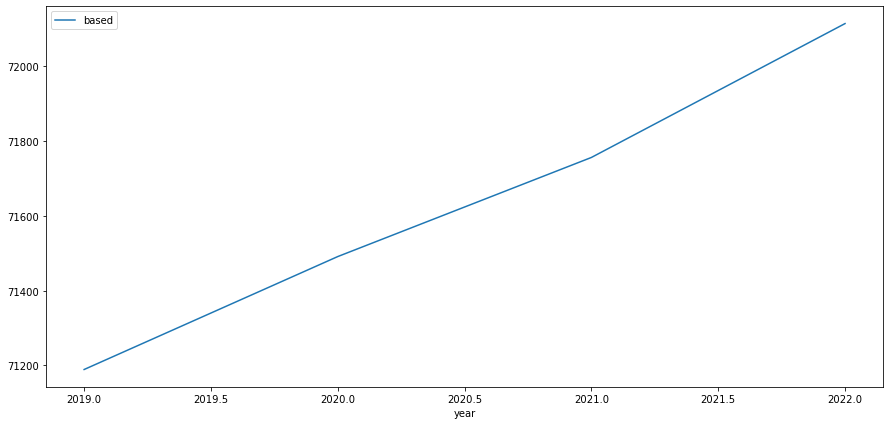

In [342]:
fig, ax = plt.subplots(figsize=(15, 7))
based_df[based_df['cfips']==1095].plot('year', 'based',ax=ax)

In [343]:
based_df_min = based_df.groupby(['cfips'],as_index=False)['based'].min()
based_df_max = based_df.groupby(['cfips'],as_index=False)['based'].max()

In [344]:
based_df_min

,cfips,based
0,1001,41527.000566
1,1003,158361.000239
2,1005,19803.999845
3,1007,17790.000320
4,1009,44102.000999
...,...,...
3130,56037,31973.999764
3131,56039,18487.999992
3132,56041,14505.999986
3133,56043,6044.999930


In [345]:
based_df

,cfips,year,based
0,1001,2019,41527.000566
1,1001,2020,41831.000120
2,1001,2021,42174.999207
3,1001,2022,42496.000055
4,1003,2019,158361.000239
...,...,...,...
12535,56043,2022,6044.999930
12536,56045,2019,5617.999902
12537,56045,2020,5594.999946
12538,56045,2021,5567.000026


In [346]:
based_df = based_df.join(based_df_min.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_min')

In [347]:
based_df = based_df.join(based_df_max.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_max')

In [354]:
#based_df = based_df.drop("min_based", axis='columns')
#based_df = based_df.drop("max_based", axis='columns')

In [355]:
based_df['based_min']

0         41527.000566
1         41527.000566
2         41527.000566
3         41527.000566
4        158361.000239
             ...      
12535      6044.999930
12536      5567.000026
12537      5567.000026
12538      5567.000026
12539      5567.000026
Name: based_min, Length: 12540, dtype: float64

In [359]:
based_df_2022 = based_df[based_df['year']==2022][['cfips','based']]

In [360]:
based_df_2019 = based_df[based_df['year']==2019][['cfips','based']]

In [361]:
based_df = based_df.join(based_df_2019.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_2019')
based_df = based_df.join(based_df_2022.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_2022')

In [362]:
based_df

,cfips,year,based,based_min,based_max,based_2019,based_2022
0,1001,2019,41527.000566,41527.000566,42496.000055,41527.000566,42496.000055
1,1001,2020,41831.000120,41527.000566,42496.000055,41527.000566,42496.000055
2,1001,2021,42174.999207,41527.000566,42496.000055,41527.000566,42496.000055
3,1001,2022,42496.000055,41527.000566,42496.000055,41527.000566,42496.000055
4,1003,2019,158361.000239,158361.000239,171296.001449,158361.000239,171296.001449
...,...,...,...,...,...,...,...
12535,56043,2022,6044.999930,6044.999930,6223.000160,6223.000160,6044.999930
12536,56045,2019,5617.999902,5567.000026,5617.999902,5617.999902,5600.999839
12537,56045,2020,5594.999946,5567.000026,5617.999902,5617.999902,5600.999839
12538,56045,2021,5567.000026,5567.000026,5617.999902,5617.999902,5600.999839


In [366]:
based_df.apply(lambda x: x['based_2022']-x['based_2019'] , axis=1)

0          968.999488
1          968.999488
2          968.999488
3          968.999488
4        12935.001210
             ...     
12535     -178.000230
12536      -17.000063
12537      -17.000063
12538      -17.000063
12539      -17.000063
Length: 12540, dtype: float64

In [367]:
based_df['diff_2022_2019'] = based_df.apply(lambda x: x['based_2022']-x['based_2019'] , axis=1)

In [371]:
based_df['diff_plus'] = based_df.apply(lambda x: 1 if x['diff_2022_2019']>=0 else 0 , axis=1)

In [372]:
based_df

,cfips,year,based,based_min,based_max,based_2019,based_2022,diff_2022_2019,diff_plus
0,1001,2019,41527.000566,41527.000566,42496.000055,41527.000566,42496.000055,968.999488,1
1,1001,2020,41831.000120,41527.000566,42496.000055,41527.000566,42496.000055,968.999488,1
2,1001,2021,42174.999207,41527.000566,42496.000055,41527.000566,42496.000055,968.999488,1
3,1001,2022,42496.000055,41527.000566,42496.000055,41527.000566,42496.000055,968.999488,1
4,1003,2019,158361.000239,158361.000239,171296.001449,158361.000239,171296.001449,12935.001210,1
...,...,...,...,...,...,...,...,...,...
12535,56043,2022,6044.999930,6044.999930,6223.000160,6223.000160,6044.999930,-178.000230,0
12536,56045,2019,5617.999902,5567.000026,5617.999902,5617.999902,5600.999839,-17.000063,0
12537,56045,2020,5594.999946,5567.000026,5617.999902,5617.999902,5600.999839,-17.000063,0
12538,56045,2021,5567.000026,5567.000026,5617.999902,5617.999902,5600.999839,-17.000063,0


In [374]:
cfips_dummy = pd.get_dummies(based_df['cfips'],drop_first=True)

In [375]:
cfips_dummy

1003   1005   1007   1009   1011   1013   1015   1017   1019   1021   \
0          0      0      0      0      0      0      0      0      0      0   
1          0      0      0      0      0      0      0      0      0      0   
2          0      0      0      0      0      0      0      0      0      0   
3          0      0      0      0      0      0      0      0      0      0   
4          1      0      0      0      0      0      0      0      0      0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
12535      0      0      0      0      0      0      0      0      0      0   
12536      0      0      0      0      0      0      0      0      0      0   
12537      0      0      0      0      0      0      0      0      0      0   
12538      0      0      0      0      0      0      0      0      0      0   
12539      0      0      0      0      0      0      0      0      0      0   

       1023   1025   1027   1029   1031   1033   1035   1037   1039   1041   \
0          0      0      0      0      0      0      0      0      0      0   
1          0      0      0      0      0      0      0      0      0      0   
2          0      0      0      0      0      0      0      0      0      0   
3          0      0      0      0      0      0      0      0      0      0   
4          0      0      0      0      0      0      0      0      0      0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
12535      0      0      0      0      0      0      0      0      0      0   
12536      0      0      0      0      0      0      0      0      0      0   
12537      0      0      0      0      0      0      0      0      0      0   
12538      0      0      0      0      0      0      0      0      0      0   
12539      0      0      0      0      0      0      0      0      0      0   

       1043   1045   1047   1049   1051   1053   1055   1057   1059   1061   \
0          0      0      0      0      0      0      0      0      0      0   
1          0      0      0      0      0      0      0      0      0      0   
2          0      0      0      0      0      0      0      0      0      0   
3          0      0      0      0      0      0      0      0      0      0   
4          0      0      0      0      0      0      0      0      0      0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
12535      0      0      0      0      0      0      0      0      0      0   
12536      0      0      0      0      0      0      0      0      0      0   
12537      0      0      0      0      0      0      0      0      0      0   
12538      0      0      0      0      0      0      0      0      0      0   
12539      0      0      0      0      0      0      0      0      0      0   

       1063   1065   1067   1069   1071   1073   1075   1077   1079   1081   \
0          0      0      0      0      0      0      0      0      0      0   
1          0      0      0      0      0      0      0      0      0      0   
2          0      0      0      0      0      0      0      0      0      0   
3          0      0      0      0      0      0      0      0      0      0   
4          0      0      0      0      0      0      0      0      0      0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
12535      0      0      0      0      0      0      0      0      0      0   
12536      0      0      0      0      0      0      0      0      0      0   
12537      0      0      0      0      0      0      0      0      0      0   
12538      0      0      0      0      0      0      0      0      0      0   
12539      0      0      0      0      0      0      0      0      0      0   

       1083   1085   1087   1089   1091   1093   1095   1097   1099   1101   \
0          0      0      0      0      0      0      0      0      0      0   
1          0      0      0      0      0      0      

In [376]:
based_df = pd.concat([based_df,cfips_dummy], axis=1)

In [377]:
based_df

cfips  year          based      based_min      based_max  \
0       1001  2019   41527.000566   41527.000566   42496.000055   
1       1001  2020   41831.000120   41527.000566   42496.000055   
2       1001  2021   42174.999207   41527.000566   42496.000055   
3       1001  2022   42496.000055   41527.000566   42496.000055   
4       1003  2019  158361.000239  158361.000239  171296.001449   
...      ...   ...            ...            ...            ...   
12535  56043  2022    6044.999930    6044.999930    6223.000160   
12536  56045  2019    5617.999902    5567.000026    5617.999902   
12537  56045  2020    5594.999946    5567.000026    5617.999902   
12538  56045  2021    5567.000026    5567.000026    5617.999902   
12539  56045  2022    5600.999839    5567.000026    5617.999902   

          based_2019     based_2022  diff_2022_2019  diff_plus  1003  1005  \
0       41527.000566   42496.000055      968.999488          1     0     0   
1       41527.000566   42496.000055      968.999488          1     0     0   
2       41527.000566   42496.000055      968.999488          1     0     0   
3       41527.000566   42496.000055      968.999488          1     0     0   
4      158361.000239  171296.001449    12935.001210          1     1     0   
...              ...            ...             ...        ...   ...   ...   
12535    6223.000160    6044.999930     -178.000230          0     0     0   
12536    5617.999902    5600.999839      -17.000063          0     0     0   
12537    5617.999902    5600.999839      -17.000063          0     0     0   
12538    5617.999902    5600.999839      -17.000063          0     0     0   
12539    5617.999902    5600.999839      -17.000063          0     0     0   

       1007  1009  1011  1013  1015  1017  1019  1021  1023  1025  1027  1029  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1031  1033  1035  1037  1039  1041  1043  1045  1047  1049  1051  1053  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1055  1057  1059  1061  1063  1065  1067  1069  1071  1073  1075  1077  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     

In [380]:
based_df_X = based_df.drop(["cfips","based","based_min","based_max","based_2019","based_2022","diff_2022_2019"], axis='columns')
based_df_Y = based_df['based']

In [379]:
based_df.drop(["cfips","based","based_min","based_max","based_2019","based_2022","diff_2022_2019"], axis='columns')

year  diff_plus  1003  1005  1007  1009  1011  1013  1015  1017  1019  \
0      2019          1     0     0     0     0     0     0     0     0     0   
1      2020          1     0     0     0     0     0     0     0     0     0   
2      2021          1     0     0     0     0     0     0     0     0     0   
3      2022          1     0     0     0     0     0     0     0     0     0   
4      2019          1     1     0     0     0     0     0     0     0     0   
...     ...        ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535  2022          0     0     0     0     0     0     0     0     0     0   
12536  2019          0     0     0     0     0     0     0     0     0     0   
12537  2020          0     0     0     0     0     0     0     0     0     0   
12538  2021          0     0     0     0     0     0     0     0     0     0   
12539  2022          0     0     0     0     0     0     0     0     0     0   

       1021  1023  1025  1027  1029  1031  1033  1035  1037  1039  1041  1043  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1045  1047  1049  1051  1053  1055  1057  1059  1061  1063  1065  1067  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1069  1071  1073  1075  1077  1079  1081  1083  1085  1087  1089  1091  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1093  1095  1097  1099  1101  1103  1105  1107  1109  1111  1113  1115  \
0         0     0     0     0     0     0     

### Train prediction base value model for using based to calculate microbusiness density

In [381]:
reg_based_df = LinearRegression()
reg_based_df.fit(based_df_X, based_df_Y)

LinearRegression()

In [382]:
reg_based_df_pred = reg_based_df.predict(based_df_X)

In [383]:
reg_based_df_pred

array([41072.9528685 , 41695.81761401, 42318.68235952, ...,
        5283.81755542,  5906.68230092,  6529.54704643])

In [384]:
print( 'R2 = ' + str(reg_based_df.score(based_df_X, based_df_Y)) )
print( 'MSE = ' + str(mean_squared_error(based_df_Y, reg_based_df_pred, squared=False)))

R2 = 0.999838657154929
MSE = 3241.8855401134297


In [394]:
year2=[]

for i in range(12540):
    if(i%4 == 0) : year2.append(2023)
    elif(i%4 == 1) : year2.append(2024) 
    elif(i%4 == 2) : year2.append(2025) 
    else : year2.append(2026)

In [395]:
len(year2)

12540

In [397]:
based_df_test_X = based_df_X

In [400]:
based_df_test_X['year'] = year2

In [401]:
based_df_test_X

year  diff_plus  1003  1005  1007  1009  1011  1013  1015  1017  1019  \
0      2023          1     0     0     0     0     0     0     0     0     0   
1      2024          1     0     0     0     0     0     0     0     0     0   
2      2025          1     0     0     0     0     0     0     0     0     0   
3      2026          1     0     0     0     0     0     0     0     0     0   
4      2023          1     1     0     0     0     0     0     0     0     0   
...     ...        ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535  2026          0     0     0     0     0     0     0     0     0     0   
12536  2023          0     0     0     0     0     0     0     0     0     0   
12537  2024          0     0     0     0     0     0     0     0     0     0   
12538  2025          0     0     0     0     0     0     0     0     0     0   
12539  2026          0     0     0     0     0     0     0     0     0     0   

       1021  1023  1025  1027  1029  1031  1033  1035  1037  1039  1041  1043  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1045  1047  1049  1051  1053  1055  1057  1059  1061  1063  1065  1067  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1069  1071  1073  1075  1077  1079  1081  1083  1085  1087  1089  1091  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1093  1095  1097  1099  1101  1103  1105  1107  1109  1111  1113  1115  \
0         0     0     0     0     0     0     

In [402]:
pred_based_test = reg_based_df.predict(based_df_test_X)

In [403]:
pred_based_test

array([43564.41185054, 44187.27659604, 44810.14134155, ...,
        7775.27653745,  8398.14128296,  9021.00602846])

In [404]:
based_df_used = based_df[['cfips','year','based']]

In [406]:
based_df_used['year'] = year2
based_df_used['based'] = pred_based_test

<ipython-input-406-3dc1666f17af>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-406-3dc1666f17af>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [407]:
based_df_used

,cfips,year,based
0,1001,2023,43564.411851
1,1001,2024,44187.276596
2,1001,2025,44810.141342
3,1001,2026,45433.006087
4,1003,2023,166227.662249
...,...,...,...
12535,56043,2026,9551.756103
12536,56045,2023,7152.411792
12537,56045,2024,7775.276537
12538,56045,2025,8398.141283


In [408]:
based_rf = RandomForestRegressor(n_estimators = 5, random_state = 0)
based_rf.fit(based_df_X, based_df_Y)
based_rf_pred = based_rf.predict(based_df_X)

In [409]:
print( 'R2 = ' + str(based_rf.score(based_df_X, based_df_Y)) )
print( 'MSE = ' + str(mean_squared_error(based_df_Y, based_rf_pred, squared=False)))

R2 = 0.9979585920818363
MSE = 11531.55087513898


In [410]:
based_rf_pred

array([29165.40038616, 30955.20004401, 35545.39938471, ...,
        5886.79993231,  5573.79998827,  5559.39991537])

In [411]:
based_df_used['based_rf'] = based_rf_pred

<ipython-input-411-3a8fc1e2ffb1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [412]:
based_df_used

,cfips,year,based,based_rf
0,1001,2023,43564.411851,29165.400386
1,1001,2024,44187.276596,30955.200044
2,1001,2025,44810.141342,35545.399385
3,1001,2026,45433.006087,35843.000054
4,1003,2023,166227.662249,163282.199990
...,...,...,...,...
12535,56043,2026,9551.756103,5956.199912
12536,56045,2023,7152.411792,5893.600000
12537,56045,2024,7775.276537,5886.799932
12538,56045,2025,8398.141283,5573.799988


In [413]:
based_df

cfips  year          based      based_min      based_max  \
0       1001  2019   41527.000566   41527.000566   42496.000055   
1       1001  2020   41831.000120   41527.000566   42496.000055   
2       1001  2021   42174.999207   41527.000566   42496.000055   
3       1001  2022   42496.000055   41527.000566   42496.000055   
4       1003  2019  158361.000239  158361.000239  171296.001449   
...      ...   ...            ...            ...            ...   
12535  56043  2022    6044.999930    6044.999930    6223.000160   
12536  56045  2019    5617.999902    5567.000026    5617.999902   
12537  56045  2020    5594.999946    5567.000026    5617.999902   
12538  56045  2021    5567.000026    5567.000026    5617.999902   
12539  56045  2022    5600.999839    5567.000026    5617.999902   

          based_2019     based_2022  diff_2022_2019  diff_plus  1003  1005  \
0       41527.000566   42496.000055      968.999488          1     0     0   
1       41527.000566   42496.000055      968.999488          1     0     0   
2       41527.000566   42496.000055      968.999488          1     0     0   
3       41527.000566   42496.000055      968.999488          1     0     0   
4      158361.000239  171296.001449    12935.001210          1     1     0   
...              ...            ...             ...        ...   ...   ...   
12535    6223.000160    6044.999930     -178.000230          0     0     0   
12536    5617.999902    5600.999839      -17.000063          0     0     0   
12537    5617.999902    5600.999839      -17.000063          0     0     0   
12538    5617.999902    5600.999839      -17.000063          0     0     0   
12539    5617.999902    5600.999839      -17.000063          0     0     0   

       1007  1009  1011  1013  1015  1017  1019  1021  1023  1025  1027  1029  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1031  1033  1035  1037  1039  1041  1043  1045  1047  1049  1051  1053  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     0   
3         0     0     0     0     0     0     0     0     0     0     0     0   
4         0     0     0     0     0     0     0     0     0     0     0     0   
...     ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
12535     0     0     0     0     0     0     0     0     0     0     0     0   
12536     0     0     0     0     0     0     0     0     0     0     0     0   
12537     0     0     0     0     0     0     0     0     0     0     0     0   
12538     0     0     0     0     0     0     0     0     0     0     0     0   
12539     0     0     0     0     0     0     0     0     0     0     0     0   

       1055  1057  1059  1061  1063  1065  1067  1069  1071  1073  1075  1077  \
0         0     0     0     0     0     0     0     0     0     0     0     0   
1         0     0     0     0     0     0     0     0     0     0     0     0   
2         0     0     0     0     0     0     0     0     0     0     0     

In [414]:
based_df_used['based_2022'] = based_df['based_2022']

<ipython-input-414-b4a76e785df2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [415]:
based_df_used

,cfips,year,based,based_rf,based_2022
0,1001,2023,43564.411851,29165.400386,42496.000055
1,1001,2024,44187.276596,30955.200044,42496.000055
2,1001,2025,44810.141342,35545.399385,42496.000055
3,1001,2026,45433.006087,35843.000054,42496.000055
4,1003,2023,166227.662249,163282.199990,171296.001449
...,...,...,...,...,...
12535,56043,2026,9551.756103,5956.199912,6044.999930
12536,56045,2023,7152.411792,5893.600000,5600.999839
12537,56045,2024,7775.276537,5886.799932,5600.999839
12538,56045,2025,8398.141283,5573.799988,5600.999839


In [456]:
based_df_used2 = based_df_used[based_df_used['year']==2023]

In [458]:
based_df_used2 = based_df_used2.drop(['year','based','based_rf'] , axis='columns' )

In [459]:
based_df_used2

,cfips,based_2022
0,1001,42496.000055
4,1003,171296.001449
8,1005,19803.999845
12,1007,17790.000320
16,1009,44382.999668
...,...,...
12520,56037,32048.999822
12524,56039,19163.999983
12528,56041,14515.999735
12532,56043,6044.999930


# Predict base value test dataset

In [416]:
GoDaddy_test

,row_id,cfips,first_day_of_month
0,1001_2022-11-01,1001,2022-11-01
1,1003_2022-11-01,1003,2022-11-01
2,1005_2022-11-01,1005,2022-11-01
3,1007_2022-11-01,1007,2022-11-01
4,1009_2022-11-01,1009,2022-11-01
...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01
25076,56039_2023-06-01,56039,2023-06-01
25077,56041_2023-06-01,56041,2023-06-01
25078,56043_2023-06-01,56043,2023-06-01


In [417]:
GoDaddy_train_train_all_X

year  month  Acadia Parish  Accomack County  Ada County  Adair County  \
0       2019      8              0                0           0             0   
1       2019      9              0                0           0             0   
2       2019     10              0                0           0             0   
3       2019     11              0                0           0             0   
4       2019     12              0                0           0             0   
...      ...    ...            ...              ...         ...           ...   
122250  2021      8              0                0           0             0   
122251  2021      9              0                0           0             0   
122252  2021     10              0                0           0             0   
122253  2021     11              0                0           0             0   
122254  2021     12              0                0           0             0   

        Adams County  Addison County  Aiken County  Aitkin County  \
0                  0               0             0              0   
1                  0               0             0              0   
2                  0               0             0              0   
3                  0               0             0              0   
4                  0               0             0              0   
...              ...             ...           ...            ...   
122250             0               0             0              0   
122251             0               0             0              0   
122252             0               0             0              0   
122253             0               0             0              0   
122254             0               0             0              0   

        Alachua County  Alamance County  Alameda County  Alamosa County  \
0                    0                0               0               0   
1                    0                0               0               0   
2                    0                0               0               0   
3                    0                0               0               0   
4                    0                0               0               0   
...                ...              ...             ...             ...   
122250               0                0               0               0   
122251               0                0               0               0   
122252               0                0               0               0   
122253               0                0               0               0   
122254               0                0               0               0   

        Albany County  Albemarle County  Alcona County  Alcorn County  \
0                   0                 0              0              0   
1                   0                 0              0              0   
2                   0                 0              0              0   
3                   0                 0              0              0   
4                   0                 0              0              0   
...               ...               ...            ...            ...   
122250              0                 0              0              0   
122251              0                 0              0              0   
122252              0                 0              0              0   
122253              0                 0              0              0   
122254              0                 0              0              0   

        Aleutians East Borough  Aleutians West Census Area  Alexander County  \
0                            0                           0                 0   
1                            0                           0                 0   
2                            0                           0                 0   
3                            0                           0                 0   
4                           

In [418]:
GoDaddy_test['year'] = GoDaddy_test.apply(lambda x: int(x['first_day_of_month'].split('-')[0]),axis=1)
GoDaddy_test['month'] = GoDaddy_test.apply(lambda x: int(x['first_day_of_month'].split('-')[1]),axis=1)

In [419]:
GoDaddy_test

,row_id,cfips,first_day_of_month,year,month
0,1001_2022-11-01,1001,2022-11-01,2022,11
1,1003_2022-11-01,1003,2022-11-01,2022,11
2,1005_2022-11-01,1005,2022-11-01,2022,11
3,1007_2022-11-01,1007,2022-11-01,2022,11
4,1009_2022-11-01,1009,2022-11-01,2022,11
...,...,...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01,2023,6
25076,56039_2023-06-01,56039,2023-06-01,2023,6
25077,56041_2023-06-01,56041,2023-06-01,2023,6
25078,56043_2023-06-01,56043,2023-06-01,2023,6


In [424]:
GoDaddy_train_for_join = GoDaddy_train[['cfips','county','state']]

In [436]:
GoDaddy_train_for_join = GoDaddy_train_for_join.drop_duplicates()

In [437]:
GoDaddy_train_for_join

,cfips,county,state
0,1001,Autauga County,Alabama
39,1003,Baldwin County,Alabama
78,1005,Barbour County,Alabama
117,1007,Bibb County,Alabama
156,1009,Blount County,Alabama
...,...,...,...
122070,56037,Sweetwater County,Wyoming
122109,56039,Teton County,Wyoming
122148,56041,Uinta County,Wyoming
122187,56043,Washakie County,Wyoming


In [438]:
GoDaddy_test2 = GoDaddy_test.join(GoDaddy_train_for_join.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_min')

In [439]:
GoDaddy_test2

,row_id,cfips,first_day_of_month,year,month,county,state
0,1001_2022-11-01,1001,2022-11-01,2022,11,Autauga County,Alabama
1,1003_2022-11-01,1003,2022-11-01,2022,11,Baldwin County,Alabama
2,1005_2022-11-01,1005,2022-11-01,2022,11,Barbour County,Alabama
3,1007_2022-11-01,1007,2022-11-01,2022,11,Bibb County,Alabama
4,1009_2022-11-01,1009,2022-11-01,2022,11,Blount County,Alabama
...,...,...,...,...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01,2023,6,Sweetwater County,Wyoming
25076,56039_2023-06-01,56039,2023-06-01,2023,6,Teton County,Wyoming
25077,56041_2023-06-01,56041,2023-06-01,2023,6,Uinta County,Wyoming
25078,56043_2023-06-01,56043,2023-06-01,2023,6,Washakie County,Wyoming


In [440]:
county_dummy2 = pd.get_dummies(GoDaddy_test2['county'],drop_first=True)
state_dummy2 = pd.get_dummies(GoDaddy_test2['state'],drop_first=True)

In [441]:
county_dummy2

Acadia Parish  Accomack County  Ada County  Adair County  Adams County  \
0                  0                0           0             0             0   
1                  0                0           0             0             0   
2                  0                0           0             0             0   
3                  0                0           0             0             0   
4                  0                0           0             0             0   
...              ...              ...         ...           ...           ...   
25075              0                0           0             0             0   
25076              0                0           0             0             0   
25077              0                0           0             0             0   
25078              0                0           0             0             0   
25079              0                0           0             0             0   

       Addison County  Aiken County  Aitkin County  Alachua County  \
0                   0             0              0               0   
1                   0             0              0               0   
2                   0             0              0               0   
3                   0             0              0               0   
4                   0             0              0               0   
...               ...           ...            ...             ...   
25075               0             0              0               0   
25076               0             0              0               0   
25077               0             0              0               0   
25078               0             0              0               0   
25079               0             0              0               0   

       Alamance County  Alameda County  Alamosa County  Albany County  \
0                    0               0               0              0   
1                    0               0               0              0   
2                    0               0               0              0   
3                    0               0               0              0   
4                    0               0               0              0   
...                ...             ...             ...            ...   
25075                0               0               0              0   
25076                0               0               0              0   
25077                0               0               0              0   
25078                0               0               0              0   
25079                0               0               0              0   

       Albemarle County  Alcona County  Alcorn County  Aleutians East Borough  \
0                     0              0              0                       0   
1                     0              0              0                       0   
2                     0              0              0                       0   
3                     0              0              0                       0   
4                     0              0              0                       0   
...                 ...            ...            ...                     ...   
25075                 0              0              0                       0   
25076                 0              0              0                       0   
25077                 0              0              0                       0   
25078                 0              0              0                       0   
25079                 0              0              0                       0   

       Aleutians West Census Area  Alexander County  Alexandria city  \
0                               0                 0                0   
1                               0                 0                0   
2                               0                 0                0   
3                               0                 0    

In [442]:
GoDaddy_test_X = GoDaddy_test2[['year','month']]

In [443]:
GoDaddy_test_X = pd.concat([GoDaddy_test_X,county_dummy2, state_dummy2], axis=1)

In [444]:
GoDaddy_test_X

year  month  Acadia Parish  Accomack County  Ada County  Adair County  \
0      2022     11              0                0           0             0   
1      2022     11              0                0           0             0   
2      2022     11              0                0           0             0   
3      2022     11              0                0           0             0   
4      2022     11              0                0           0             0   
...     ...    ...            ...              ...         ...           ...   
25075  2023      6              0                0           0             0   
25076  2023      6              0                0           0             0   
25077  2023      6              0                0           0             0   
25078  2023      6              0                0           0             0   
25079  2023      6              0                0           0             0   

       Adams County  Addison County  Aiken County  Aitkin County  \
0                 0               0             0              0   
1                 0               0             0              0   
2                 0               0             0              0   
3                 0               0             0              0   
4                 0               0             0              0   
...             ...             ...           ...            ...   
25075             0               0             0              0   
25076             0               0             0              0   
25077             0               0             0              0   
25078             0               0             0              0   
25079             0               0             0              0   

       Alachua County  Alamance County  Alameda County  Alamosa County  \
0                   0                0               0               0   
1                   0                0               0               0   
2                   0                0               0               0   
3                   0                0               0               0   
4                   0                0               0               0   
...               ...              ...             ...             ...   
25075               0                0               0               0   
25076               0                0               0               0   
25077               0                0               0               0   
25078               0                0               0               0   
25079               0                0               0               0   

       Albany County  Albemarle County  Alcona County  Alcorn County  \
0                  0                 0              0              0   
1                  0                 0              0              0   
2                  0                 0              0              0   
3                  0                 0              0              0   
4                  0                 0              0              0   
...              ...               ...            ...            ...   
25075              0                 0              0              0   
25076              0                 0              0              0   
25077              0                 0              0              0   
25078              0                 0              0              0   
25079              0                 0              0              0   

       Aleutians East Borough  Aleutians West Census Area  Alexander County  \
0                           0                           0                 0   
1                           0                           0                 0   
2                           0                           0                 0   
3                           0                           0                 0   
4                           0                           0                 0   
.

In [539]:
rf2_pred_test_dataset = rf9.predict(GoDaddy_test_X)

In [540]:
rf2_pred_test_dataset

array([ 1469.4, 14392.3,   240.8, ...,   567.2,   187.4,   100.9])

In [541]:
GoDaddy_test['rf2_pred_test_dataset'] = rf2_pred_test_dataset

In [542]:
GoDaddy_test['active_pred'] = GoDaddy_test['rf2_pred_test_dataset'].apply(np.ceil)

### round up prediction

In [543]:
GoDaddy_test

,row_id,cfips,first_day_of_month,year,month,rf2_pred_test_dataset,active_pred
0,1001_2022-11-01,1001,2022-11-01,2022,11,1469.4,1470.0
1,1003_2022-11-01,1003,2022-11-01,2022,11,14392.3,14393.0
2,1005_2022-11-01,1005,2022-11-01,2022,11,240.8,241.0
3,1007_2022-11-01,1007,2022-11-01,2022,11,228.8,229.0
4,1009_2022-11-01,1009,2022-11-01,2022,11,817.0,817.0
...,...,...,...,...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01,2023,6,894.9,895.0
25076,56039_2023-06-01,56039,2023-06-01,2023,6,4913.1,4914.0
25077,56041_2023-06-01,56041,2023-06-01,2023,6,567.2,568.0
25078,56043_2023-06-01,56043,2023-06-01,2023,6,187.4,188.0


In [460]:
based_df_used2

,cfips,based_2022
0,1001,42496.000055
4,1003,171296.001449
8,1005,19803.999845
12,1007,17790.000320
16,1009,44382.999668
...,...,...
12520,56037,32048.999822
12524,56039,19163.999983
12528,56041,14515.999735
12532,56043,6044.999930


In [544]:
GoDaddy_test_final = GoDaddy_test.join(based_df_used2.set_index('cfips'), on='cfips', lsuffix='', rsuffix='_min')

In [545]:
GoDaddy_test_final.apply(lambda x: (x['active_pred']/(x['based_2022']+0.0000000000000000001))*100 ,axis=1)

0         3.459149
1         8.402414
2         1.216926
3         1.287240
4         1.840795
           ...    
25075     2.792599
25076    25.641828
25077     3.912924
25078     3.110008
25079     1.803249
Length: 25080, dtype: float64

# Calculate pred microbusiness density

In [546]:
GoDaddy_test_final['microbusiness_density_pred'] = GoDaddy_test_final.apply(lambda x: (x['active_pred']/(x['based_2022']+0.0000000000000000001))*100 ,axis=1)

In [547]:
GoDaddy_test_final

,row_id,cfips,first_day_of_month,year,month,rf2_pred_test_dataset,active_pred,based_2022,microbusiness_density_pred
0,1001_2022-11-01,1001,2022-11-01,2022,11,1469.4,1470.0,42496.000055,3.459149
1,1003_2022-11-01,1003,2022-11-01,2022,11,14392.3,14393.0,171296.001449,8.402414
2,1005_2022-11-01,1005,2022-11-01,2022,11,240.8,241.0,19803.999845,1.216926
3,1007_2022-11-01,1007,2022-11-01,2022,11,228.8,229.0,17790.000320,1.287240
4,1009_2022-11-01,1009,2022-11-01,2022,11,817.0,817.0,44382.999668,1.840795
...,...,...,...,...,...,...,...,...,...
25075,56037_2023-06-01,56037,2023-06-01,2023,6,894.9,895.0,32048.999822,2.792599
25076,56039_2023-06-01,56039,2023-06-01,2023,6,4913.1,4914.0,19163.999983,25.641828
25077,56041_2023-06-01,56041,2023-06-01,2023,6,567.2,568.0,14515.999735,3.912924
25078,56043_2023-06-01,56043,2023-06-01,2023,6,187.4,188.0,6044.999930,3.110008


In [470]:
#GoDaddy_test_final.to_csv('prediction_result.csv')

In [548]:
GoDaddy_test_final2 = GoDaddy_test_final

In [549]:
GoDaddy_test_final2['microbusiness_density'] = None

In [550]:
GoDaddy_test_final2['active'] = None

In [551]:
GoDaddy_test_final2['rf2_pred'] = GoDaddy_test_final2['active_pred']

In [552]:
test = GoDaddy_test_final2[['cfips','first_day_of_month','microbusiness_density','active','rf2_pred']]

In [553]:
train_train = GoDaddy_train_train2[['cfips','first_day_of_month','microbusiness_density','active','rf2_pred']]

In [554]:
train_test = GoDaddy_train_test2[['cfips','first_day_of_month','microbusiness_density','active','rf2_pred']]

In [555]:
all_df = pd.concat([train_train,train_test, test], axis=0)

In [556]:
all_df

,cfips,first_day_of_month,microbusiness_density,active,rf2_pred
0,1001,2019-08-01,3.007682,1249,1238.8
1,1001,2019-09-01,2.884870,1198,1213.3
2,1001,2019-10-01,3.055843,1269,1245.1
3,1001,2019-11-01,2.993233,1243,1248.9
4,1001,2019-12-01,2.993233,1243,1243.7
...,...,...,...,...,...
25075,56037,2023-06-01,NaN,None,895.0
25076,56039,2023-06-01,NaN,None,4914.0
25077,56041,2023-06-01,NaN,None,568.0
25078,56043,2023-06-01,NaN,None,188.0


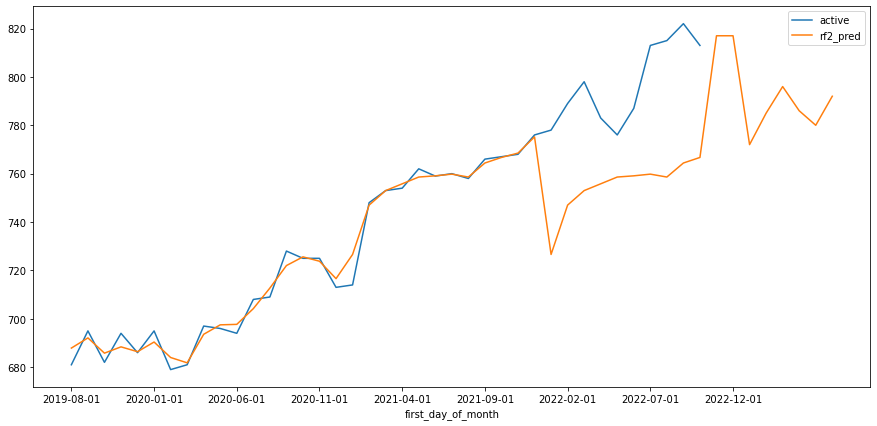

In [557]:
fig, ax = plt.subplots(figsize=(15, 7))
all_df[all_df['cfips']==1009].plot('first_day_of_month', 'active',ax=ax)
all_df[all_df['cfips']==1009].plot('first_day_of_month', 'rf2_pred',ax=ax)

In [558]:
GoDaddy_test_final[GoDaddy_test_final['cfips']==28055]

,row_id,cfips,first_day_of_month,year,month,rf2_pred_test_dataset,active_pred,based_2022,microbusiness_density_pred,microbusiness_density,active,rf2_pred
1426,28055_2022-11-01,28055,2022-11-01,2022,11,0.0,0.0,0.0,0.000000e+00,None,None,0.0
4561,28055_2022-12-01,28055,2022-12-01,2022,12,0.0,0.0,0.0,0.000000e+00,None,None,0.0
7696,28055_2023-01-01,28055,2023-01-01,2023,1,0.4,1.0,0.0,1.000000e+21,None,None,1.0
10831,28055_2023-02-01,28055,2023-02-01,2023,2,0.0,0.0,0.0,0.000000e+00,None,None,0.0
13966,28055_2023-03-01,28055,2023-03-01,2023,3,0.0,0.0,0.0,0.000000e+00,None,None,0.0
17101,28055_2023-04-01,28055,2023-04-01,2023,4,0.0,0.0,0.0,0.000000e+00,None,None,0.0
20236,28055_2023-05-01,28055,2023-05-01,2023,5,0.0,0.0,0.0,0.000000e+00,None,None,0.0
23371,28055_2023-06-01,28055,2023-06-01,2023,6,0.0,0.0,0.0,0.000000e+00,None,None,0.0


In [559]:
GoDaddy_submission = GoDaddy_test_final[['row_id','microbusiness_density_pred']]

In [560]:
GoDaddy_submission['microbusiness_density'] = GoDaddy_submission['microbusiness_density_pred']

<ipython-input-560-e35be71f1263>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## Save submission submit to Kaggle

In [561]:
#GoDaddy_submission2.to_csv('GoDaddy_submission.csv')

In [562]:
GoDaddy_submission2=GoDaddy_submission[['row_id','microbusiness_density']]

In [564]:
GoDaddy_submission2[GoDaddy_submission2['microbusiness_density']>=1000]

,row_id,microbusiness_density
7696,28055_2023-01-01,1.000000e+21


In [565]:
GoDaddy_submission2.loc[7696,'microbusiness_density'] = 0

/Users/pimawatmingkwan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [519]:
GoDaddy_submission2.loc[10831,'microbusiness_density'] = 0

/Users/pimawatmingkwan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [520]:
GoDaddy_submission2.loc[13966,'microbusiness_density'] = 0

In [566]:
GoDaddy_submission2[GoDaddy_submission2['microbusiness_density']>=1000]

,row_id,microbusiness_density


In [567]:
#GoDaddy_submission2.to_csv('GoDaddy_submission.csv',index=False)

# ------------------------END------------------------------

In [524]:
GoDaddy_train

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,year,month,based
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019,8,41526.999161
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019,9,41526.999633
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019,10,41527.001038
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019,11,41527.001499
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019,12,41527.001499
...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022,6,5600.999720
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022,7,5600.999720
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022,8,5600.999859
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022,9,5600.999859


In [525]:
GoDaddy_train_master = GoDaddy_train

In [526]:
county_dummy = pd.get_dummies(GoDaddy_train_master['county'],drop_first=True)
state_dummy = pd.get_dummies(GoDaddy_train_master['state'],drop_first=True)

In [527]:
GoDaddy_train_master_all = pd.concat([GoDaddy_train_master,county_dummy, state_dummy], axis=1)

In [530]:
GoDaddy_train_master_all = GoDaddy_train_master_all.drop('based',axis='columns')

In [536]:
GoDaddy_train_master_all

row_id  cfips          county    state first_day_of_month  \
0        1001_2019-08-01   1001  Autauga County  Alabama         2019-08-01   
1        1001_2019-09-01   1001  Autauga County  Alabama         2019-09-01   
2        1001_2019-10-01   1001  Autauga County  Alabama         2019-10-01   
3        1001_2019-11-01   1001  Autauga County  Alabama         2019-11-01   
4        1001_2019-12-01   1001  Autauga County  Alabama         2019-12-01   
...                  ...    ...             ...      ...                ...   
122260  56045_2022-06-01  56045   Weston County  Wyoming         2022-06-01   
122261  56045_2022-07-01  56045   Weston County  Wyoming         2022-07-01   
122262  56045_2022-08-01  56045   Weston County  Wyoming         2022-08-01   
122263  56045_2022-09-01  56045   Weston County  Wyoming         2022-09-01   
122264  56045_2022-10-01  56045   Weston County  Wyoming         2022-10-01   

        microbusiness_density  active  year  month  Acadia Parish  \
0                    3.007682    1249  2019      8              0   
1                    2.884870    1198  2019      9              0   
2                    3.055843    1269  2019     10              0   
3                    2.993233    1243  2019     11              0   
4                    2.993233    1243  2019     12              0   
...                       ...     ...   ...    ...            ...   
122260               1.803249     101  2022      6              0   
122261               1.803249     101  2022      7              0   
122262               1.785396     100  2022      8              0   
122263               1.785396     100  2022      9              0   
122264               1.785396     100  2022     10              0   

        Accomack County  Ada County  Adair County  Adams County  \
0                     0           0             0             0   
1                     0           0             0             0   
2                     0           0             0             0   
3                     0           0             0             0   
4                     0           0             0             0   
...                 ...         ...           ...           ...   
122260                0           0             0             0   
122261                0           0             0             0   
122262                0           0             0             0   
122263                0           0             0             0   
122264                0           0             0             0   

        Addison County  Aiken County  Aitkin County  Alachua County  \
0                    0             0              0               0   
1                    0             0              0               0   
2                    0             0              0               0   
3                    0             0              0               0   
4                    0             0              0               0   
...                ...           ...            ...             ...   
122260               0             0              0               0   
122261               0             0              0               0   
122262               0             0              0               0   
122263               0             0              0               0   
122264               0             0              0               0   

        Alamance County  Alameda County  Alamosa County  Albany County  \
0                     0               0               0              0   
1                     0               0               0              0   
2                     0               0               0              0   
3                     0               0               0              0   
4                     0               0               0              0   
...                 ...             ...             ...            ...   
122260                0               0               0         

In [537]:
GoDaddy_train_master_all_Y = GoDaddy_train_master_all['active']

In [534]:
GoDaddy_train_master_all_X = GoDaddy_train_master_all.iloc[:,7:]

In [535]:
GoDaddy_train_master_all_X

year  month  Acadia Parish  Accomack County  Ada County  Adair County  \
0       2019      8              0                0           0             0   
1       2019      9              0                0           0             0   
2       2019     10              0                0           0             0   
3       2019     11              0                0           0             0   
4       2019     12              0                0           0             0   
...      ...    ...            ...              ...         ...           ...   
122260  2022      6              0                0           0             0   
122261  2022      7              0                0           0             0   
122262  2022      8              0                0           0             0   
122263  2022      9              0                0           0             0   
122264  2022     10              0                0           0             0   

        Adams County  Addison County  Aiken County  Aitkin County  \
0                  0               0             0              0   
1                  0               0             0              0   
2                  0               0             0              0   
3                  0               0             0              0   
4                  0               0             0              0   
...              ...             ...           ...            ...   
122260             0               0             0              0   
122261             0               0             0              0   
122262             0               0             0              0   
122263             0               0             0              0   
122264             0               0             0              0   

        Alachua County  Alamance County  Alameda County  Alamosa County  \
0                    0                0               0               0   
1                    0                0               0               0   
2                    0                0               0               0   
3                    0                0               0               0   
4                    0                0               0               0   
...                ...              ...             ...             ...   
122260               0                0               0               0   
122261               0                0               0               0   
122262               0                0               0               0   
122263               0                0               0               0   
122264               0                0               0               0   

        Albany County  Albemarle County  Alcona County  Alcorn County  \
0                   0                 0              0              0   
1                   0                 0              0              0   
2                   0                 0              0              0   
3                   0                 0              0              0   
4                   0                 0              0              0   
...               ...               ...            ...            ...   
122260              0                 0              0              0   
122261              0                 0              0              0   
122262              0                 0              0              0   
122263              0                 0              0              0   
122264              0                 0              0              0   

        Aleutians East Borough  Aleutians West Census Area  Alexander County  \
0                            0                           0                 0   
1                            0                           0                 0   
2                            0                           0                 0   
3                            0                           0                 0   
4                           

In [538]:
rf9 = RandomForestRegressor(n_estimators = 10, random_state = 0)
rf9.fit(GoDaddy_train_master_all_X, GoDaddy_train_master_all_Y)

RandomForestRegressor(n_estimators=10, random_state=0)